# Azure Computer Vision 4 (Florence)

## Fashion Visual Search - Images analysis

![Image](florence.jpg?raw=true)
![Image](fashionheader.png?raw=true)

<br>
<i>Note: this image was generated with Azure Open AI Dall-e 2</i>

### Visual search with vector embeddings
**Vector embeddings** are a way of representing content such as text or images as vectors of real numbers in a high-dimensional space. These embeddings are often learned from large amounts of textual and visual data using machine learning algorithms like neural networks. Each dimension of the vector corresponds to a different feature or attribute of the content, such as its semantic meaning, syntactic role, or context in which it commonly appears. By representing content as vectors, we can perform mathematical operations on them to compare their similarity or use them as inputs to machine learning models.

![Image](embeddings.jpg?raw=true)


### Business applications
- **Digital asset management**: Image retrieval can be used to manage large collections of digital images, such as in museums, archives, or online galleries. Users can search for images based on visual features and retrieve the images that match their criteria.
- **Medical image retrieval**: Image retrieval can be used in medical imaging to search for images based on their diagnostic features or disease patterns. This can help doctors or researchers to identify similar cases or track disease progression.
- **Security and surveillance**: Image retrieval can be used in security and surveillance systems to search for images based on specific features or patterns, such as in, people & object tracking, or threat detection.
- **Forensic image retrieval**: Image retrieval can be used in forensic investigations to search for images based on their visual content or metadata, such as in cases of cyber-crime.
- **E-commerce**: Image retrieval can be used in online shopping applications to search for similar products based on their features or descriptions or provide recommendations based on previous purchases.
- **Fashion and design**: Image retrieval can be used in fashion and design to search for images based on their visual features, such as color, pattern, or texture. This can help designers or retailers to identify similar products or trends.

### Visual Search Process
![Image](fashionprocess.png?raw=true)

### Image Retrieval with Azure Computer Vision Documentation
- https://learn.microsoft.com/en-us/azure/cognitive-services/computer-vision/concept-image-retrieval
- https://learn.microsoft.com/en-us/azure/cognitive-services/computer-vision/how-to/image-retrieval

### Demo images
Demo images are a sample of this collection of images: https://www.kaggle.com/competitions/h-and-m-personalized-fashion-recommendations/data
<br><br>
> Serge Retkowsky | Microsoft | https://github.com/retkowsky | 2nd of May, 2023

## 1. <a name="chapt1"></a> Librairies

In [2]:
import datetime
import glob
import json
import os
import random
import sys
import time

from dotenv import load_dotenv
from PIL import Image

<IPython.core.display.Javascript object>

In [3]:
# Getting Azure CV endpoint and key from the azure.env file

load_dotenv("azure.env")
key = os.getenv("azure_cv_key")
endpoint = os.getenv("azure_cv_endpoint")

<IPython.core.display.Javascript object>

### Importing our specific functions

In [4]:
pyfile = "visualsearch.py"

print("Python file:", pyfile, "Date:", time.ctime(os.path.getmtime(pyfile)))

Python file: visualsearch.py Date: Tue May  2 11:38:05 2023


<IPython.core.display.Javascript object>

In [5]:
from visualsearch import (
    describe_image_with_AzureCV4,
    get_image_from_url,
    get_results_using_image,
    get_results_using_prompt,
    remove_background,
    side_by_side_images,
    view_image,
)

<IPython.core.display.Javascript object>

## 2. <a name="chapt2"></a> Informations

In [6]:
sys.version

'3.8.5 (default, Sep  4 2020, 07:30:14) \n[GCC 7.3.0]'

<IPython.core.display.Javascript object>

In [7]:
print("Today is", datetime.datetime.today())

Today is 2023-05-02 12:05:47.339114


<IPython.core.display.Javascript object>

## 3. <a name="chapt3"></a> Our products images

In [8]:
IMAGES_DIR = "fashion"

<IPython.core.display.Javascript object>

In [9]:
image_files = glob.glob(IMAGES_DIR + "/*")

print("Directory of images:", IMAGES_DIR)
print("Total number of catalog images =", "{:,}".format(len(image_files)))

Directory of images: fashion
Total number of catalog images = 1,473


<IPython.core.display.Javascript object>

### Some images

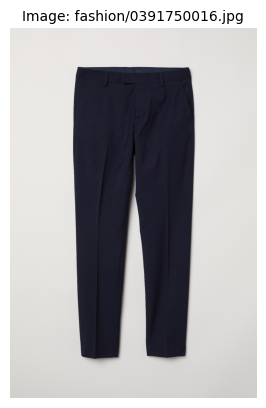

Automatic analysis of the image using Azure Computer Vision 4.0:

   Main caption:
    a pair of pants on a wall = 0.434

   Detected tags:
    clothing           = 1.000
    trouser            = 0.986
    trousers           = 0.895
    pocket             = 0.868
    person             = 0.846
    pants              = 0.437


<IPython.core.display.Javascript object>

In [10]:
idx = 1

view_image(image_files[idx])
describe_image_with_AzureCV4(image_files[idx])

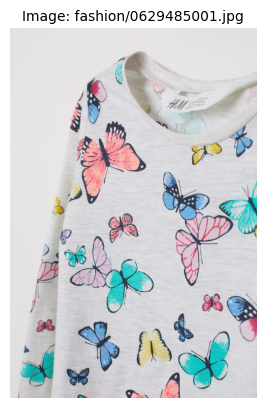

Automatic analysis of the image using Azure Computer Vision 4.0:

   Main caption:
    a shirt with butterflies on it = 0.628

   Detected tags:
    butterfly          = 0.962
    moths and butterflies = 0.912
    pattern (fashion design) = 0.908
    invertebrate       = 0.883
    insect             = 0.881


<IPython.core.display.Javascript object>

In [11]:
idx = 500

view_image(image_files[idx])
describe_image_with_AzureCV4(image_files[idx])

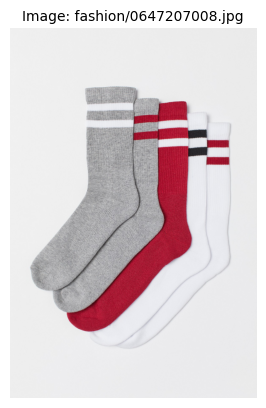

Automatic analysis of the image using Azure Computer Vision 4.0:

   Main caption:
    a group of socks with white and red stripes = 0.402

   Detected tags:
    clothing           = 0.996
    sock               = 0.524


<IPython.core.display.Javascript object>

In [12]:
idx = int(random.uniform(0, len(image_files)))

view_image(image_files[idx])
describe_image_with_AzureCV4(image_files[idx])

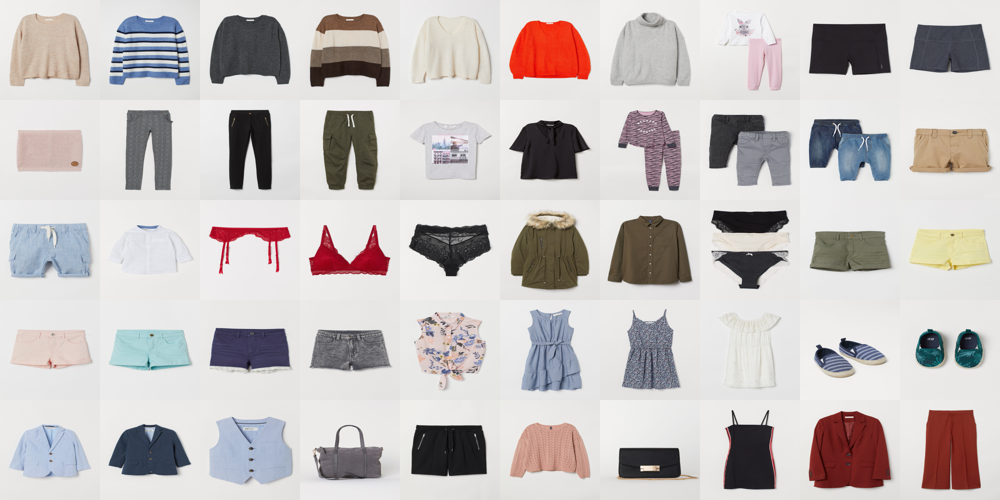

<IPython.core.display.Javascript object>

In [13]:
num_images_per_row = 10
num_images_per_col = 5

img_size = 200
start = 1000
samples = image_files[start : start + (num_images_per_row * num_images_per_col)]

samples_images = Image.new(
    "RGB", (num_images_per_row * img_size, num_images_per_col * img_size)
)

for idx, image_file in enumerate(samples):
    img = Image.open(image_file)
    img = img.resize((img_size, img_size))
    x = (idx % num_images_per_row) * img_size
    y = (idx // num_images_per_row) * img_size
    samples_images.paste(img, (x, y))

samples_images

## 4. <a name="chapt4"></a> Loading vector embeddings

In [14]:
JSON_DIR = "json"

glob.glob(JSON_DIR + "/*.json")

['json/img_embed_02May2023_115727.json']

<IPython.core.display.Javascript object>

In [15]:
print("Importing vectors embeddings...")

jsonfiles = [entry.name for entry in os.scandir(JSON_DIR) if entry.is_file()]
jsonfiles = [f for f in jsonfiles if os.path.isfile(os.path.join(JSON_DIR, f))]

# Get the most recent file
modification_times = [
    (f, os.path.getmtime(os.path.join(JSON_DIR, f))) for f in jsonfiles
]
modification_times.sort(key=lambda x: x[1], reverse=True)
most_recent_file = JSON_DIR + "/" + modification_times[0][0]

# Loading the most recent file
print(f"Loading the most recent file of the vector embeddings: {most_recent_file}")

with open(most_recent_file) as f:
    list_emb = json.load(f)

print(f"\nDone: number of imported vector embeddings = {len(list_emb):,}")

Importing vectors embeddings...
Loading the most recent file of the vector embeddings: json/img_embed_02May2023_115727.json

Done: number of imported vector embeddings = 1,473


<IPython.core.display.Javascript object>

## 5. <a name="chapt5"></a> Visual search using a field image

We can use a reference image and find the most similar images.
In this demo we will use the reference image without its background
(Azure Computer Vision 4 can automatically remove the background). The search will be made using the image without its background.


In [16]:
print("Total number of catalog images =", "{:,}".format(len(image_files)))

Total number of catalog images = 1,473


<IPython.core.display.Javascript object>

In [17]:
TEST_DIR = "test"

test_images = glob.glob(f"{TEST_DIR}/*")
print(f"Total number of test images = {len(test_images)}")

Total number of test images = 6


<IPython.core.display.Javascript object>

### Test 1

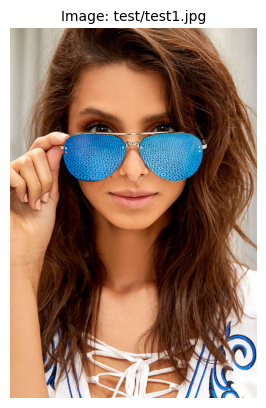

Automatic analysis of the image using Azure Computer Vision 4.0:

   Main caption:
    a woman wearing blue sunglasses = 0.501

   Detected tags:
    human face         = 0.990
    person             = 0.988
    fashion accessory  = 0.947
    goggles            = 0.931
    long hair          = 0.930
    clothing           = 0.924
    lipstick           = 0.915
    lip                = 0.911
    eyewear            = 0.894
    cool               = 0.868
    photo shoot        = 0.868
    cosmetics          = 0.866
    woman              = 0.864
    fashion            = 0.857
    lip gloss          = 0.856
    throat             = 0.847
    eyelash            = 0.843
    lady               = 0.842
    model              = 0.841
    girl               = 0.671
    hair               = 0.664
    wearing            = 0.645
    sunglasses         = 0.571


<IPython.core.display.Javascript object>

In [18]:
reference_image = test_images[0]

view_image(reference_image)
describe_image_with_AzureCV4(reference_image)

Removing background from the image using Azure Computer Vision 4.0...
Done


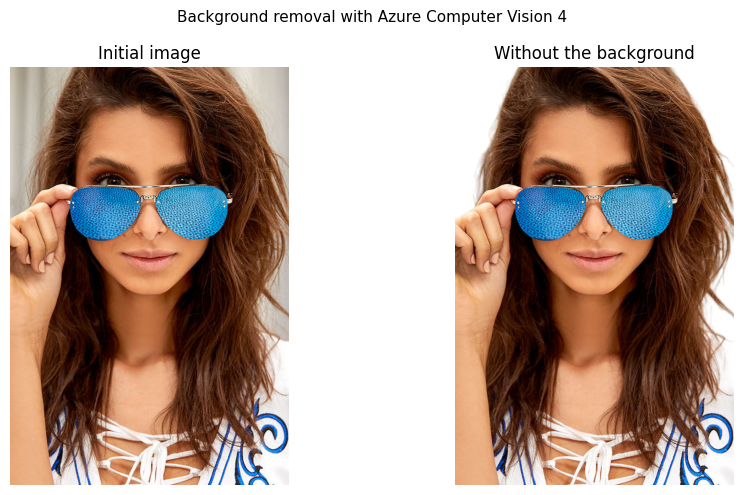

<IPython.core.display.Javascript object>

In [19]:
nobackground_image = remove_background(reference_image)
side_by_side_images(reference_image, nobackground_image)

Top 6 images:

001 fashion/0620319010.jpg with similarity index = 0.637436509662305
002 fashion/0646754002.jpg with similarity index = 0.6106177260699797
003 fashion/0620139003.jpg with similarity index = 0.5960417695498486
004 fashion/0623350001.jpg with similarity index = 0.5534199370262907
005 fashion/0398959003.jpg with similarity index = 0.5476176152378078
006 fashion/0629390001.jpg with similarity index = 0.5406044573614249


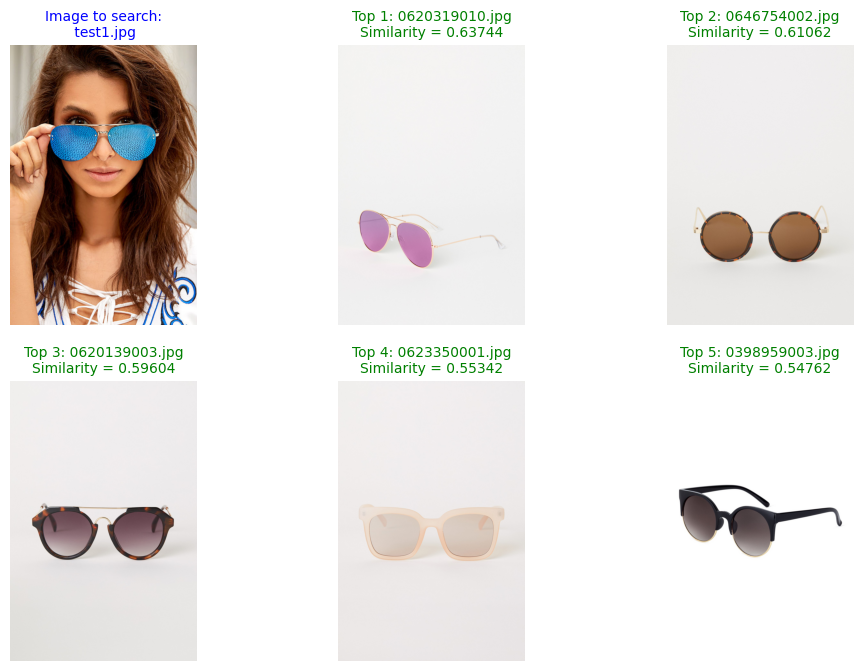

 2023-05-02 12:06:24 Powered by Azure Computer Vision Florence


,image_file,similarity
75,fashion/0620319010.jpg,0.637437
732,fashion/0646754002.jpg,0.610618
49,fashion/0620139003.jpg,0.596042
205,fashion/0623350001.jpg,0.553420
26,fashion/0398959003.jpg,0.547618
...,...,...
968,fashion/0692401002.jpg,0.236465
602,fashion/0641748010.jpg,0.233565
383,fashion/0626443007.jpg,0.233555
1071,fashion/0694297002.jpg,0.226882


<IPython.core.display.Javascript object>

In [20]:
get_results_using_image(
    reference_image, nobackground_image, image_files, list_emb, topn=6, disp=True
)

### Test 2

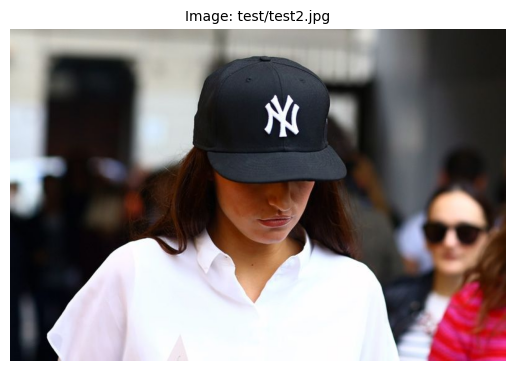

<IPython.core.display.Javascript object>

In [21]:
reference_image = test_images[1]

view_image(reference_image)

Removing background from the image using Azure Computer Vision 4.0...
Done


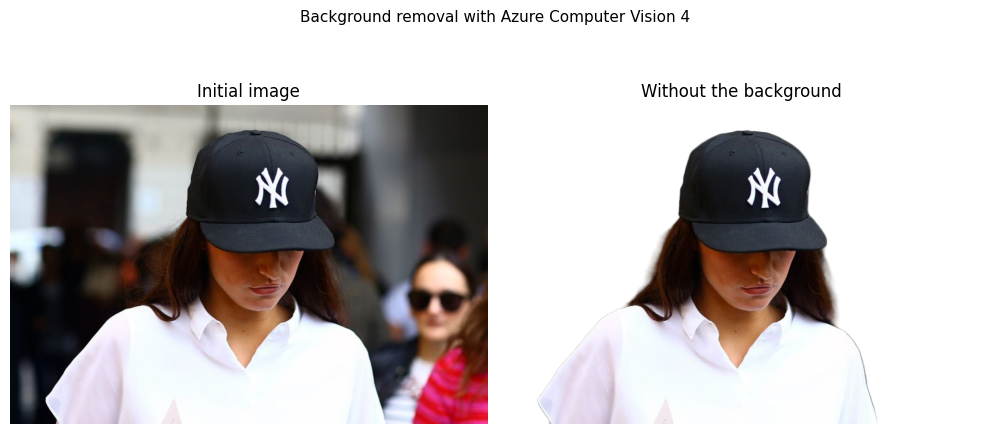

<IPython.core.display.Javascript object>

In [22]:
nobackground_image = remove_background(reference_image)
side_by_side_images(reference_image, nobackground_image)

Top 6 images:

001 fashion/0694739001.jpg with similarity index = 0.5434852974479263
002 fashion/0694739020.jpg with similarity index = 0.49539973480127936
003 fashion/0694739003.jpg with similarity index = 0.49378024245644625
004 fashion/0648703010.jpg with similarity index = 0.4815528778303834
005 fashion/0694739030.jpg with similarity index = 0.4761669808255889
006 fashion/0621768001.jpg with similarity index = 0.4648182702041969


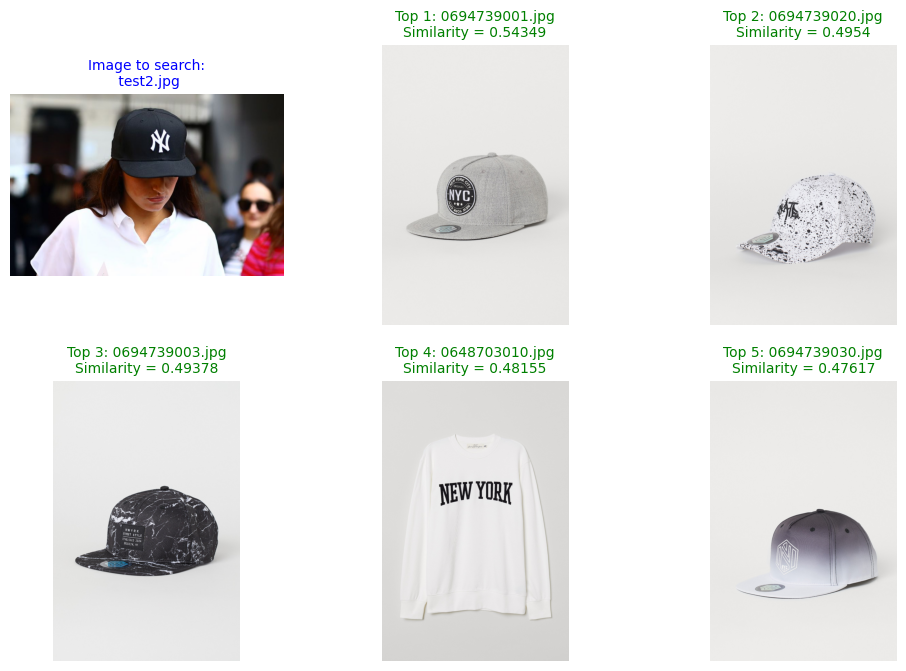

 2023-05-02 12:06:30 Powered by Azure Computer Vision Florence


,image_file,similarity
1099,fashion/0694739001.jpg,0.543485
1101,fashion/0694739020.jpg,0.495400
1100,fashion/0694739003.jpg,0.493780
816,fashion/0648703010.jpg,0.481553
1102,fashion/0694739030.jpg,0.476167
...,...,...
974,fashion/0692721002.jpg,0.198928
1324,fashion/0697814001.jpg,0.195047
1279,fashion/0697082010.jpg,0.193311
1278,fashion/0697082008.jpg,0.192758


<IPython.core.display.Javascript object>

In [23]:
get_results_using_image(
    reference_image, nobackground_image, image_files, list_emb, topn=6, disp=True
)

### Test 3

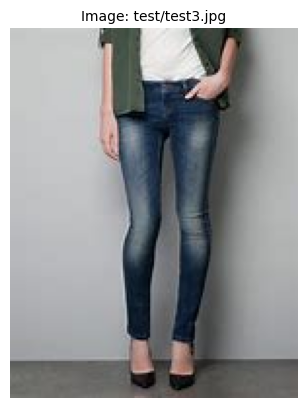

<IPython.core.display.Javascript object>

In [24]:
reference_image = test_images[2]

view_image(reference_image)

Removing background from the image using Azure Computer Vision 4.0...
Done


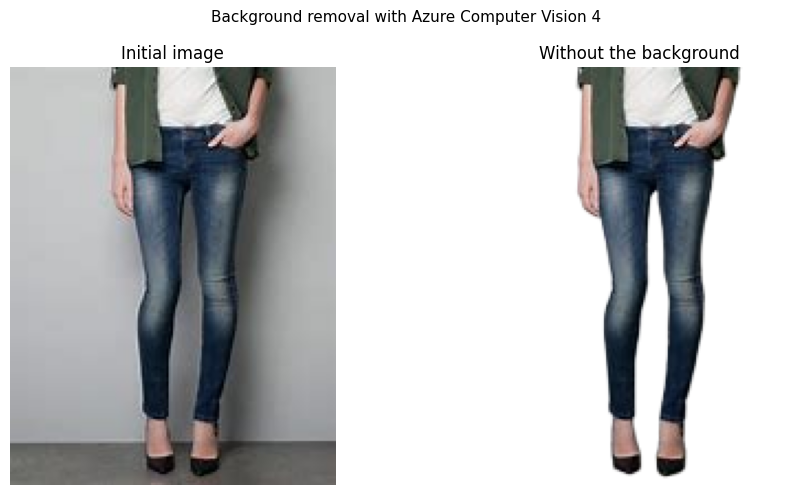

<IPython.core.display.Javascript object>

In [25]:
nobackground_image = remove_background(reference_image)
side_by_side_images(reference_image, nobackground_image)

Top 6 images:

001 fashion/0624251001.jpg with similarity index = 0.7319283858483395
002 fashion/0625047001.jpg with similarity index = 0.7096761270697101
003 fashion/0640331007.jpg with similarity index = 0.6991001896844513
004 fashion/0690933005.jpg with similarity index = 0.6977641266521103
005 fashion/0694737002.jpg with similarity index = 0.6921028144505117
006 fashion/0399136060.jpg with similarity index = 0.6912622719593444


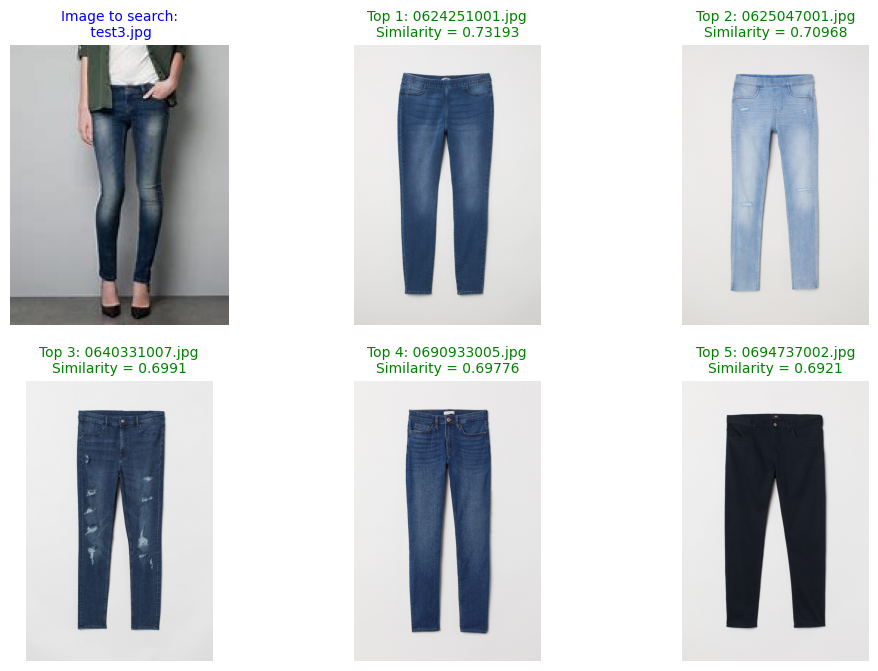

 2023-05-02 12:06:36 Powered by Azure Computer Vision Florence


,image_file,similarity
247,fashion/0624251001.jpg,0.731928
290,fashion/0625047001.jpg,0.709676
550,fashion/0640331007.jpg,0.699100
899,fashion/0690933005.jpg,0.697764
1098,fashion/0694737002.jpg,0.692103
...,...,...
506,fashion/0629656005.jpg,0.328343
1120,fashion/0695039001.jpg,0.316491
341,fashion/0625722001.jpg,0.316484
141,fashion/0621768001.jpg,0.310266


<IPython.core.display.Javascript object>

In [26]:
get_results_using_image(
    reference_image, nobackground_image, image_files, list_emb, topn=6, disp=True
)

### Test 4

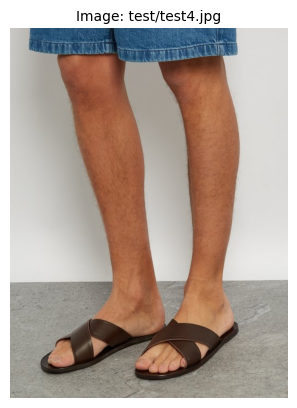

<IPython.core.display.Javascript object>

In [27]:
reference_image = test_images[3]

view_image(reference_image)

Removing background from the image using Azure Computer Vision 4.0...
Done


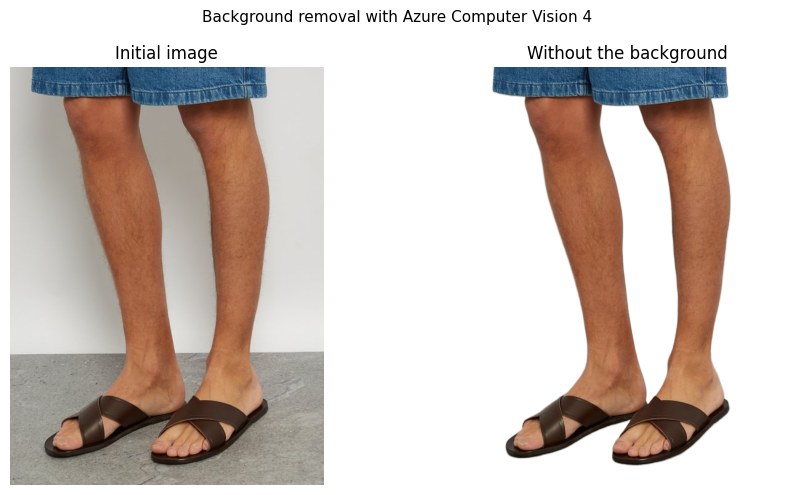

<IPython.core.display.Javascript object>

In [28]:
nobackground_image = remove_background(reference_image)
side_by_side_images(reference_image, nobackground_image)

Top 6 images:

001 fashion/0640989002.jpg with similarity index = 0.7327624773859223
002 fashion/0620608001.jpg with similarity index = 0.6754814606219758
003 fashion/0621915004.jpg with similarity index = 0.6728700256872409
004 fashion/0623934002.jpg with similarity index = 0.6681382268576408
005 fashion/0620179001.jpg with similarity index = 0.6426427551049978
006 fashion/0690472001.jpg with similarity index = 0.6300379935257805


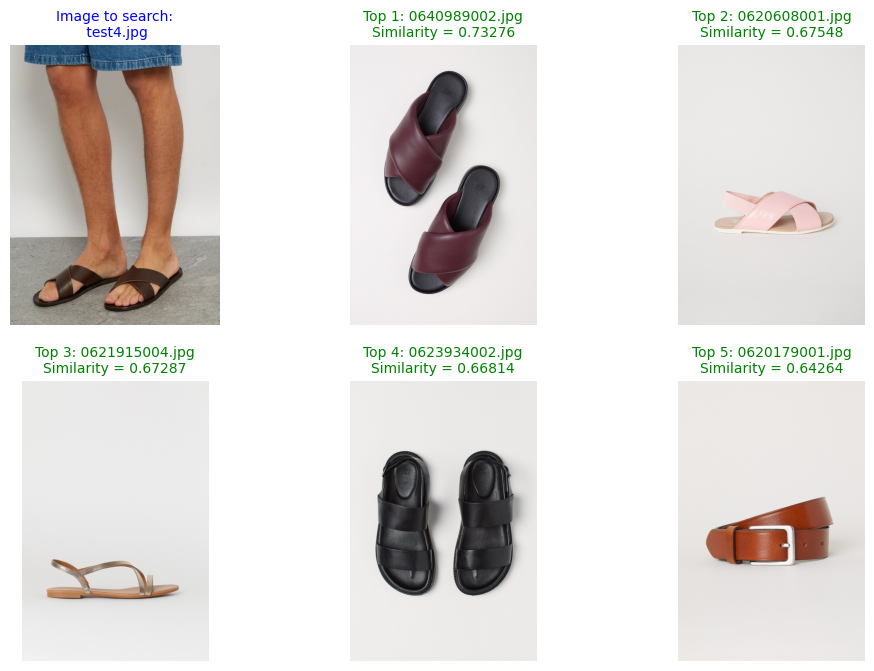

 2023-05-02 12:06:42 Powered by Azure Computer Vision Florence


,image_file,similarity
580,fashion/0640989002.jpg,0.732762
92,fashion/0620608001.jpg,0.675481
145,fashion/0621915004.jpg,0.672870
229,fashion/0623934002.jpg,0.668138
51,fashion/0620179001.jpg,0.642643
...,...,...
459,fashion/0628594001.jpg,0.271817
59,fashion/0620197036.jpg,0.271394
946,fashion/0691844006.jpg,0.266344
640,fashion/0642975002.jpg,0.259523


<IPython.core.display.Javascript object>

In [29]:
get_results_using_image(
    reference_image, nobackground_image, image_files, list_emb, topn=6, disp=True
)

### Test 5

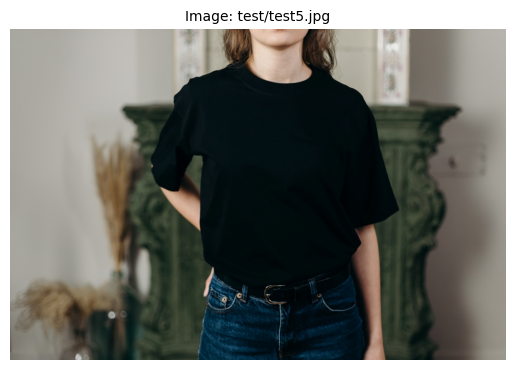

<IPython.core.display.Javascript object>

In [30]:
reference_image = test_images[4]

view_image(reference_image)

Removing background from the image using Azure Computer Vision 4.0...
Done


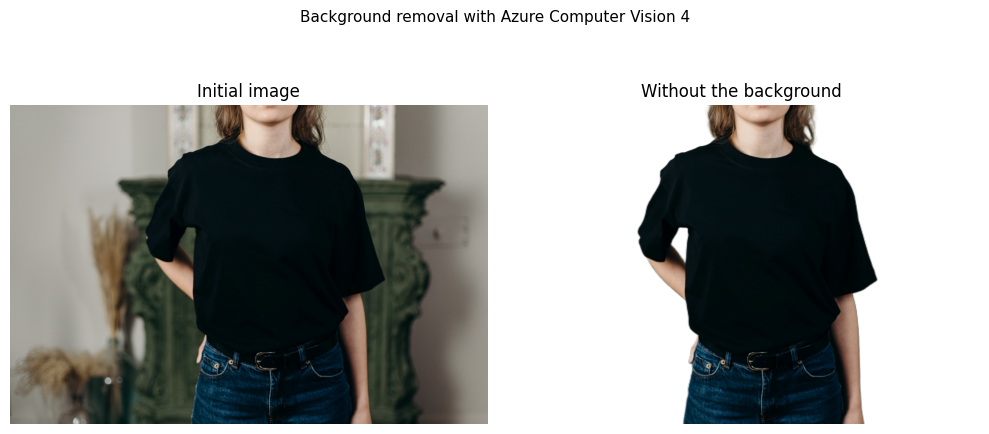

<IPython.core.display.Javascript object>

In [31]:
nobackground_image = remove_background(reference_image)
side_by_side_images(reference_image, nobackground_image)

Top 2 images:

001 fashion/0622444001.jpg with similarity index = 0.6693642539165997
002 fashion/0625939002.jpg with similarity index = 0.6648680052377844


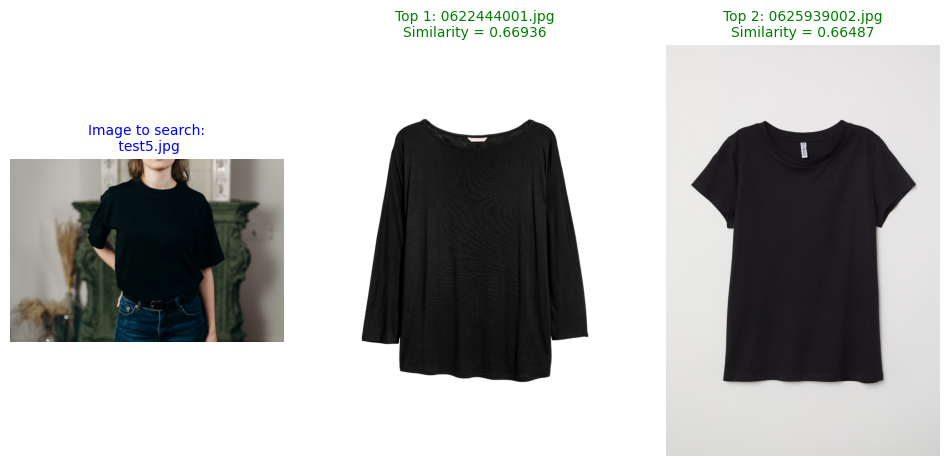

 2023-05-02 12:06:48 Powered by Azure Computer Vision Florence


,image_file,similarity
167,fashion/0622444001.jpg,0.669364
349,fashion/0625939002.jpg,0.664868
493,fashion/0629420001.jpg,0.660976
350,fashion/0625939017.jpg,0.656762
954,fashion/0692002005.jpg,0.652108
...,...,...
704,fashion/0645879002.jpg,0.288568
669,fashion/0644023001.jpg,0.286389
1122,fashion/0695043004.jpg,0.286335
1278,fashion/0697082008.jpg,0.284454


<IPython.core.display.Javascript object>

In [32]:
get_results_using_image(
    reference_image, nobackground_image, image_files, list_emb, topn=2, disp=True
)

### Test 6

In [33]:
# We can download an image from an url
image_URL = "https://github.com/retkowsky/images/blob/master/fashion_image.jpg?raw=true"
reference_image = "download.jpg"

<IPython.core.display.Javascript object>

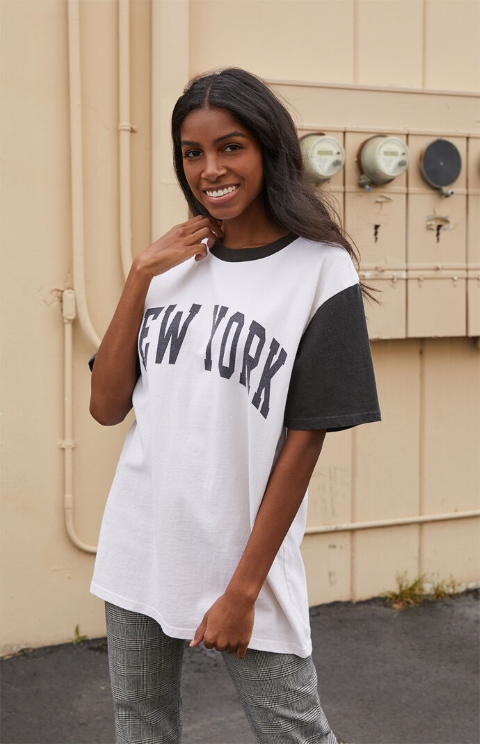

<IPython.core.display.Javascript object>

In [34]:
image = get_image_from_url(image_URL)
image

Removing background from the image using Azure Computer Vision 4.0...
Done


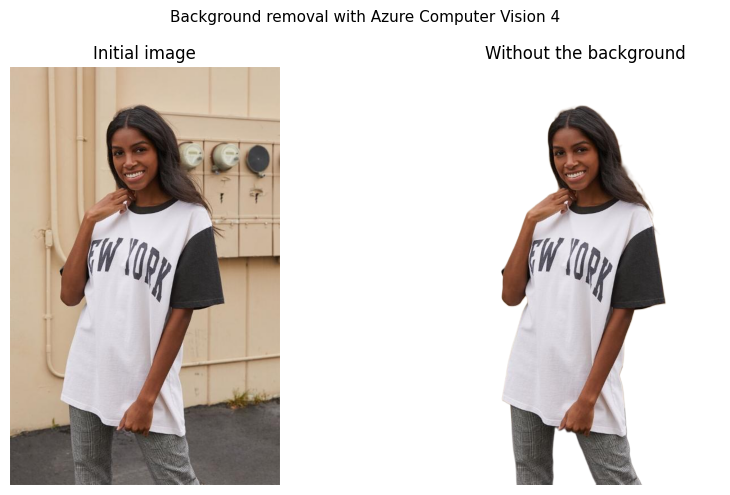

<IPython.core.display.Javascript object>

In [35]:
nobackground_image = remove_background(reference_image)
side_by_side_images(reference_image, nobackground_image)

Top 6 images:

001 fashion/0699923102.jpg with similarity index = 0.7531169789449494
002 fashion/0648703010.jpg with similarity index = 0.7072159165147744
003 fashion/0642973002.jpg with similarity index = 0.7006585788869061
004 fashion/0649440014.jpg with similarity index = 0.6663094358998435
005 fashion/0626444014.jpg with similarity index = 0.6176077322685806
006 fashion/0624486091.jpg with similarity index = 0.6110585479245998


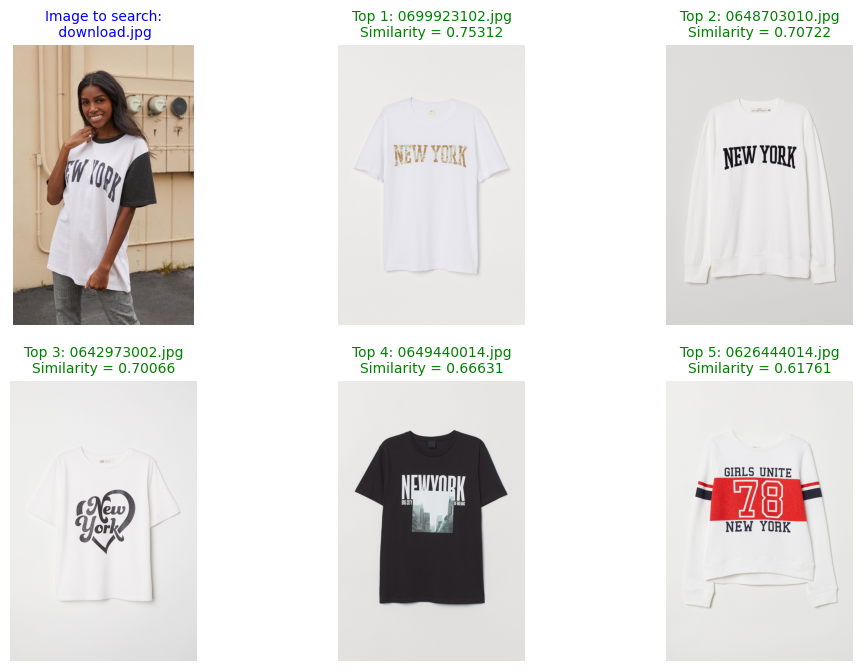

 2023-05-02 12:06:56 Powered by Azure Computer Vision Florence


,image_file,similarity
1468,fashion/0699923102.jpg,0.753117
816,fashion/0648703010.jpg,0.707216
639,fashion/0642973002.jpg,0.700659
843,fashion/0649440014.jpg,0.666309
386,fashion/0626444014.jpg,0.617608
...,...,...
1242,fashion/0696893002.jpg,0.294959
1039,fashion/0693649006.jpg,0.292063
341,fashion/0625722001.jpg,0.282393
723,fashion/0646429003.jpg,0.279228


<IPython.core.display.Javascript object>

In [36]:
get_results_using_image(
    reference_image, nobackground_image, image_files, list_emb, topn=6, disp=True
)

## 6. <a name="chapt6"></a> Visual search using some text

We can use some prompt (text) to find some articles in our catalog images.

### Test 1

In [37]:
query = "shirt with stripped lines on it"

<IPython.core.display.Javascript object>


Similar images using query = shirt with stripped lines on it


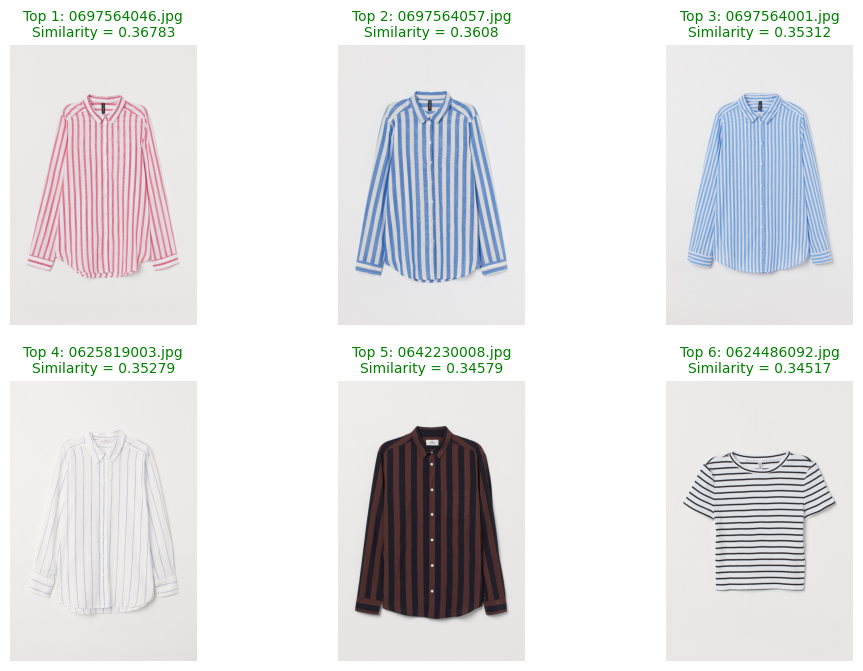

 2023-05-02 12:06:59 Powered by Azure Computer Vision Florence


,image_file,similarity
1313,fashion/0697564046.jpg,0.367830
1315,fashion/0697564057.jpg,0.360803
1309,fashion/0697564001.jpg,0.353120
346,fashion/0625819003.jpg,0.352792
617,fashion/0642230008.jpg,0.345792
...,...,...
1118,fashion/0695001001.jpg,0.101362
676,fashion/0644370001.jpg,0.099127
973,fashion/0692705001.jpg,0.094789
599,fashion/0641521002.jpg,0.091815


<IPython.core.display.Javascript object>

In [38]:
get_results_using_prompt(query, image_files, list_emb, topn=6, disp=False)

### Test 2

In [39]:
query = "torn blue jeans"

<IPython.core.display.Javascript object>


Similar images using query = torn blue jeans


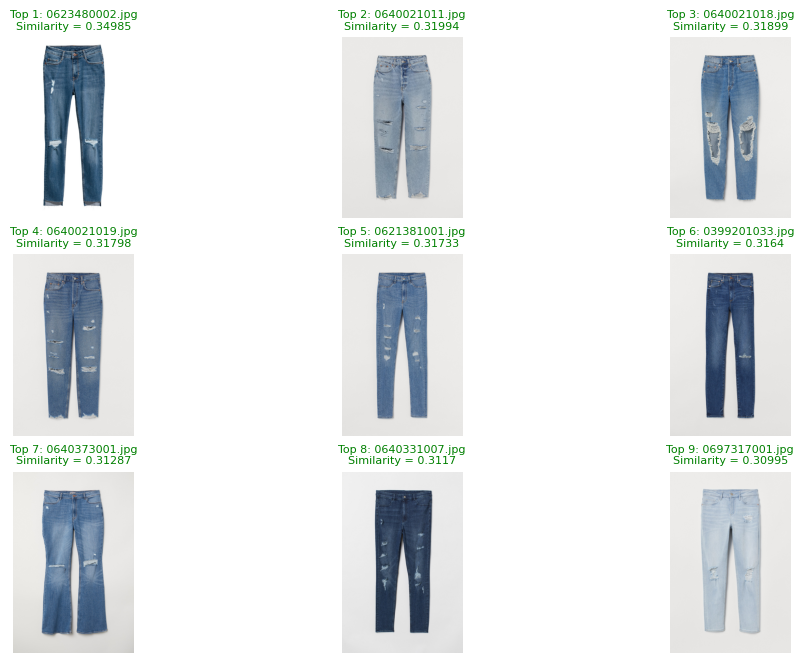

 2023-05-02 12:07:03 Powered by Azure Computer Vision Florence


,image_file,similarity
209,fashion/0623480002.jpg,0.349852
520,fashion/0640021011.jpg,0.319943
521,fashion/0640021018.jpg,0.318989
522,fashion/0640021019.jpg,0.317985
113,fashion/0621381001.jpg,0.317331
...,...,...
850,fashion/0649555002.jpg,0.072348
1212,fashion/0696316001.jpg,0.070178
1305,fashion/0697506001.jpg,0.068848
1118,fashion/0695001001.jpg,0.065537


<IPython.core.display.Javascript object>

In [40]:
get_results_using_prompt(query, image_files, list_emb, topn=9, disp=False)

### Test 3

In [41]:
query = "red dress with long sleeves"

<IPython.core.display.Javascript object>


Similar images using query = red dress with long sleeves


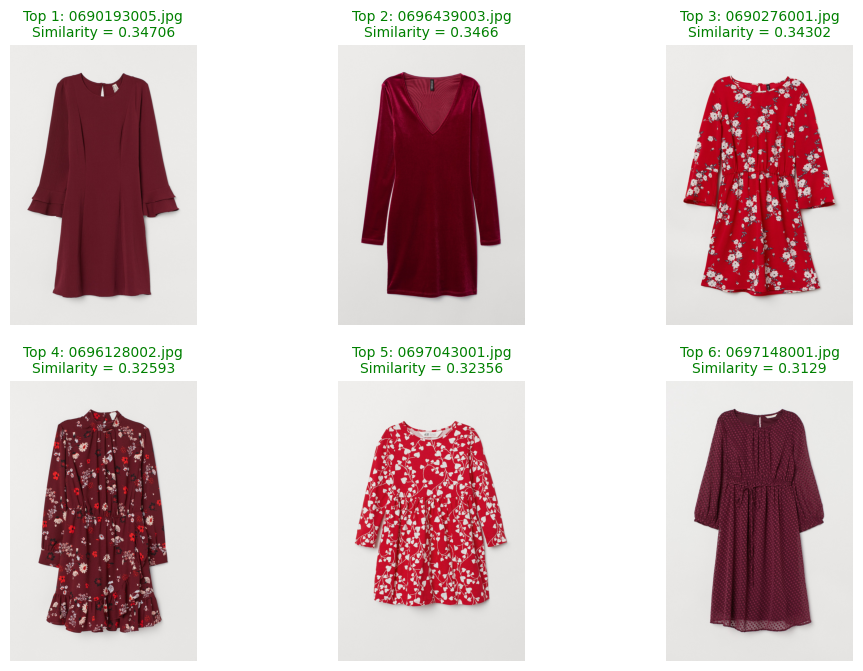

 2023-05-02 12:07:06 Powered by Azure Computer Vision Florence


,image_file,similarity
866,fashion/0690193005.jpg,0.347057
1221,fashion/0696439003.jpg,0.346602
870,fashion/0690276001.jpg,0.343025
1194,fashion/0696128002.jpg,0.325934
1263,fashion/0697043001.jpg,0.323559
...,...,...
264,fashion/0624543063.jpg,0.036165
1181,fashion/0695803006.jpg,0.035972
141,fashion/0621768001.jpg,0.033203
1100,fashion/0694739003.jpg,0.032841


<IPython.core.display.Javascript object>

In [42]:
get_results_using_prompt(query, image_files, list_emb, topn=6, disp=False)

### Test 4

In [43]:
query = "dress with flowers"

<IPython.core.display.Javascript object>


Similar images using query = dress with flowers


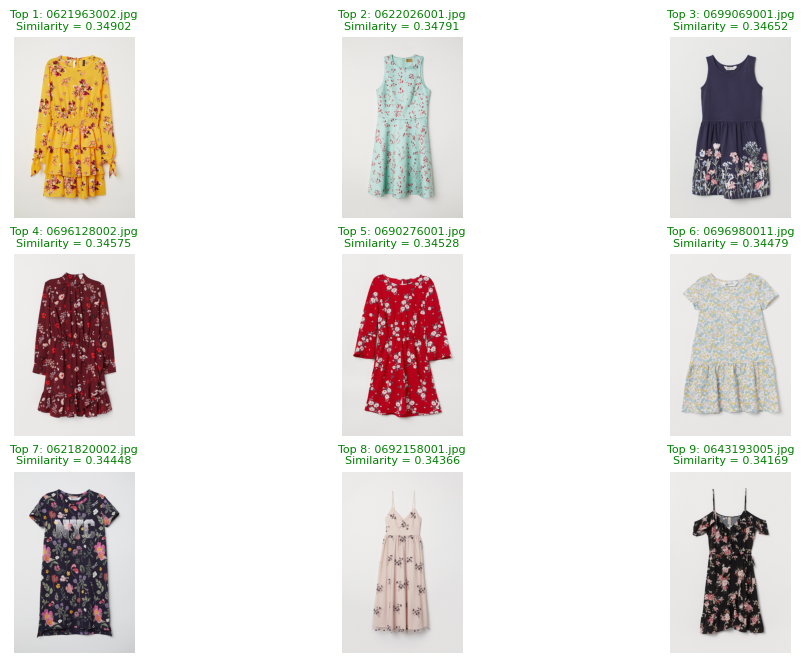

 2023-05-02 12:07:10 Powered by Azure Computer Vision Florence


,image_file,similarity
149,fashion/0621963002.jpg,0.349023
150,fashion/0622026001.jpg,0.347912
1404,fashion/0699069001.jpg,0.346516
1194,fashion/0696128002.jpg,0.345753
870,fashion/0690276001.jpg,0.345282
...,...,...
141,fashion/0621768001.jpg,0.079060
319,fashion/0625420001.jpg,0.077702
134,fashion/0621760008.jpg,0.074758
760,fashion/0647207008.jpg,0.063588


<IPython.core.display.Javascript object>

In [44]:
get_results_using_prompt(query, image_files, list_emb, topn=9, disp=False)

### Test 5

In [45]:
query = "pink shoes"

<IPython.core.display.Javascript object>


Similar images using query = pink shoes


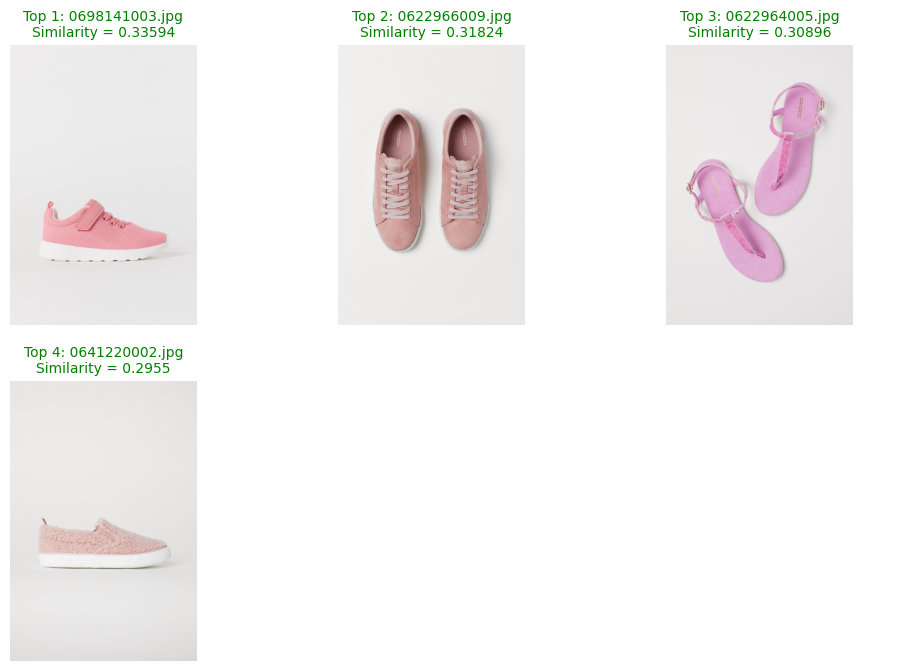

 2023-05-02 12:07:12 Powered by Azure Computer Vision Florence


,image_file,similarity
1343,fashion/0698141003.jpg,0.335938
187,fashion/0622966009.jpg,0.318244
186,fashion/0622964005.jpg,0.308963
592,fashion/0641220002.jpg,0.295498
336,fashion/0625662004.jpg,0.291777
...,...,...
1097,fashion/0694709017.jpg,0.068156
1095,fashion/0694709003.jpg,0.067956
1146,fashion/0695442001.jpg,0.063925
1143,fashion/0695411001.jpg,0.058349


<IPython.core.display.Javascript object>

In [46]:
get_results_using_prompt(query, image_files, list_emb, topn=4, disp=False)

### Test 6

In [47]:
query = "ray-ban with yellow frames"

<IPython.core.display.Javascript object>


Similar images using query = ray-ban with yellow frames


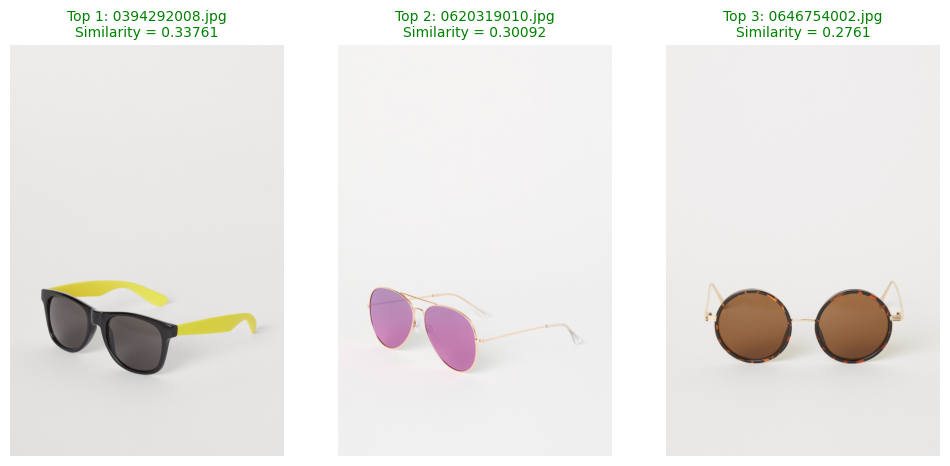

 2023-05-02 12:07:14 Powered by Azure Computer Vision Florence


,image_file,similarity
7,fashion/0394292008.jpg,0.337614
75,fashion/0620319010.jpg,0.300922
732,fashion/0646754002.jpg,0.276105
733,fashion/0646756002.jpg,0.274135
205,fashion/0623350001.jpg,0.261321
...,...,...
1427,fashion/0699349002.jpg,0.078224
181,fashion/0622955007.jpg,0.078176
571,fashion/0640735003.jpg,0.075231
348,fashion/0625930001.jpg,0.075194


<IPython.core.display.Javascript object>

In [48]:
get_results_using_prompt(query, image_files, list_emb, topn=3, disp=False)

### Test 7

In [49]:
query = "shirt with NYC written on it"

<IPython.core.display.Javascript object>


Similar images using query = shirt with NYC written on it


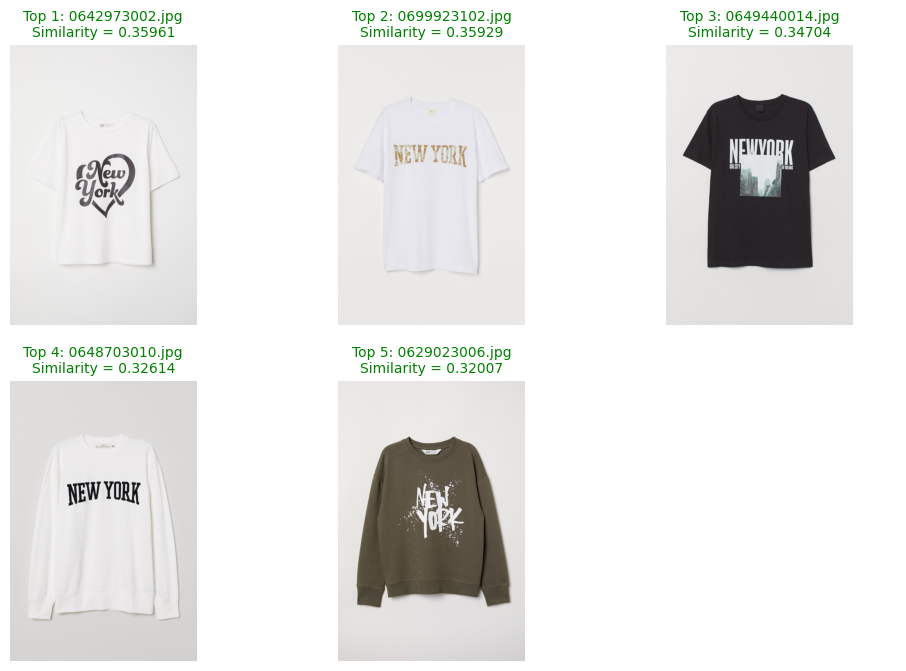

 2023-05-02 12:07:17 Powered by Azure Computer Vision Florence


,image_file,similarity
639,fashion/0642973002.jpg,0.359610
1468,fashion/0699923102.jpg,0.359292
843,fashion/0649440014.jpg,0.347039
816,fashion/0648703010.jpg,0.326136
484,fashion/0629023006.jpg,0.320074
...,...,...
92,fashion/0620608001.jpg,0.057197
246,fashion/0624216001.jpg,0.054590
580,fashion/0640989002.jpg,0.052575
1118,fashion/0695001001.jpg,0.046770


<IPython.core.display.Javascript object>

In [50]:
get_results_using_prompt(query, image_files, list_emb, topn=5, disp=False)

### Test 8

In [51]:
query = "bag with golden lace"

<IPython.core.display.Javascript object>


Similar images using query = bag with golden lace


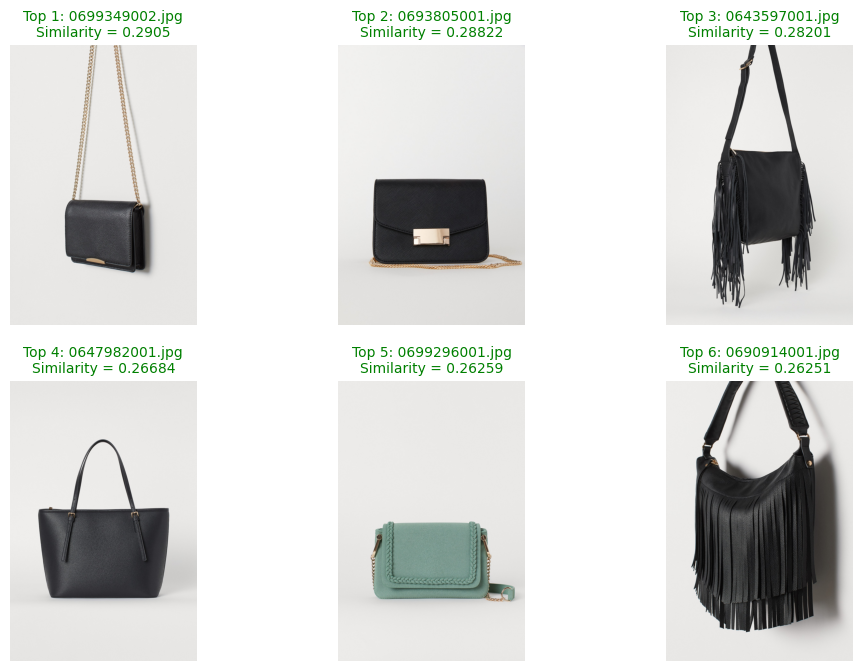

 2023-05-02 12:07:20 Powered by Azure Computer Vision Florence


,image_file,similarity
1427,fashion/0699349002.jpg,0.290497
1046,fashion/0693805001.jpg,0.288216
658,fashion/0643597001.jpg,0.282005
786,fashion/0647982001.jpg,0.266842
1423,fashion/0699296001.jpg,0.262593
...,...,...
722,fashion/0646195001.jpg,0.056448
258,fashion/0624486091.jpg,0.055559
1146,fashion/0695442001.jpg,0.050391
141,fashion/0621768001.jpg,0.049455


<IPython.core.display.Javascript object>

In [52]:
get_results_using_prompt(query, image_files, list_emb, topn=6, disp=False)

### Test 9

In [53]:
query = "dreams"

<IPython.core.display.Javascript object>

Top 3 images:

001 fashion/0620008004.jpg with similarity index = 0.2859241873689166
002 fashion/0625648002.jpg with similarity index = 0.25661091814093867
003 fashion/0640536001.jpg with similarity index = 0.23692619537249

Similar images using query = dreams


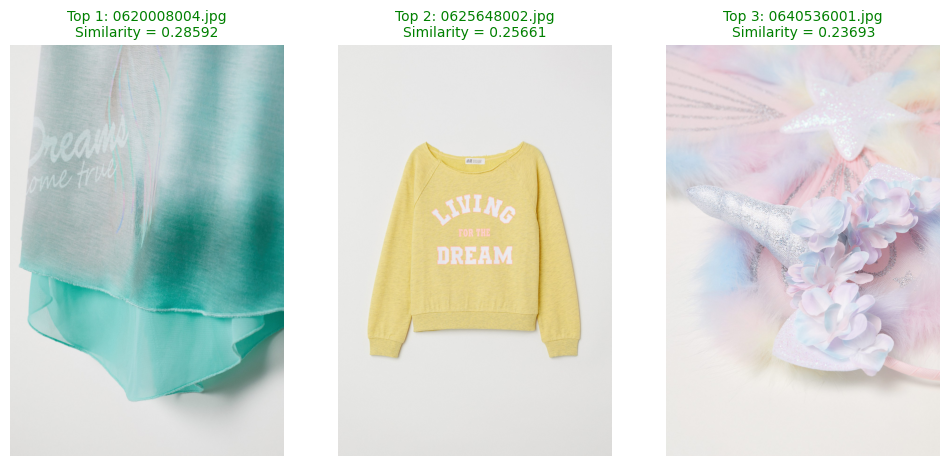

 2023-05-02 12:07:22 Powered by Azure Computer Vision Florence


,image_file,similarity
43,fashion/0620008004.jpg,0.285924
332,fashion/0625648002.jpg,0.256611
557,fashion/0640536001.jpg,0.236926
468,fashion/0628755002.jpg,0.229270
303,fashion/0625179002.jpg,0.226130
...,...,...
994,fashion/0693060003.jpg,0.113473
926,fashion/0691527002.jpg,0.113078
705,fashion/0645891001.jpg,0.112928
452,fashion/0628499008.jpg,0.112888


<IPython.core.display.Javascript object>

In [54]:
get_results_using_prompt(query, image_files, list_emb, topn=3, disp=True)

### Test 10

In [55]:
query = "article with a bird"

<IPython.core.display.Javascript object>


Similar images using query = article with a bird


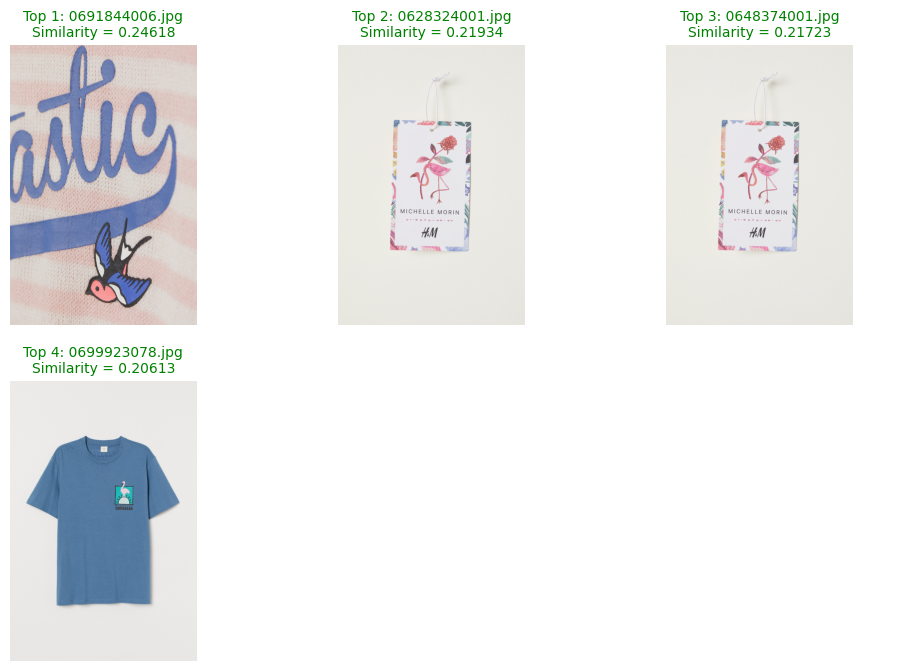

 2023-05-02 12:07:25 Powered by Azure Computer Vision Florence


,image_file,similarity
946,fashion/0691844006.jpg,0.246184
441,fashion/0628324001.jpg,0.219344
803,fashion/0648374001.jpg,0.217225
1465,fashion/0699923078.jpg,0.206131
468,fashion/0628755002.jpg,0.198585
...,...,...
571,fashion/0640735003.jpg,0.059903
135,fashion/0621760009.jpg,0.058957
26,fashion/0398959003.jpg,0.057834
1377,fashion/0698647010.jpg,0.046665


<IPython.core.display.Javascript object>

In [56]:
get_results_using_prompt(query, image_files, list_emb, topn=4, disp=False)

### Test 11

In [57]:
query = "Italian or Japanese cities"

<IPython.core.display.Javascript object>


Similar images using query = Italian or Japanese cities


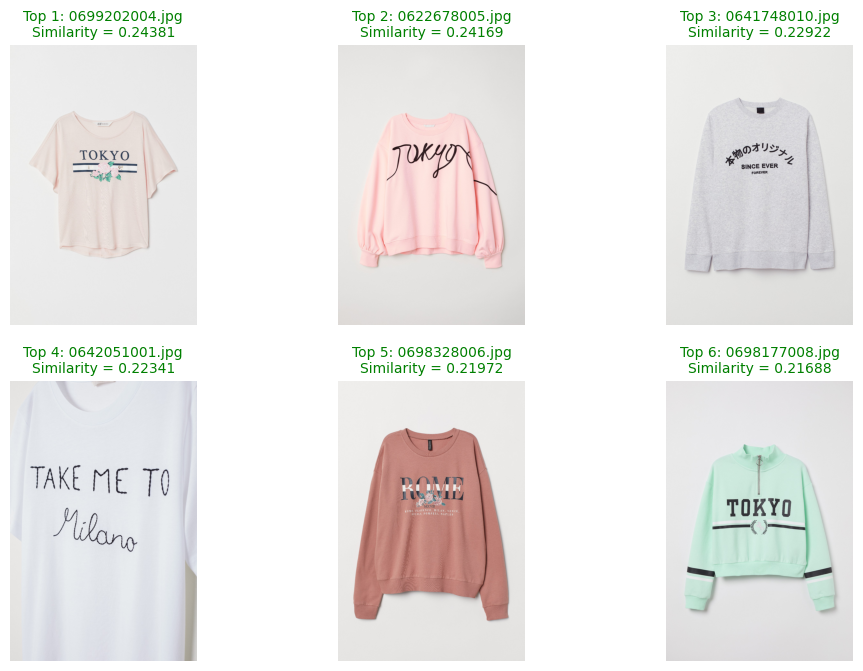

 2023-05-02 12:07:28 Powered by Azure Computer Vision Florence


,image_file,similarity
1417,fashion/0699202004.jpg,0.243808
169,fashion/0622678005.jpg,0.241688
602,fashion/0641748010.jpg,0.229215
611,fashion/0642051001.jpg,0.223412
1356,fashion/0698328006.jpg,0.219721
...,...,...
1388,fashion/0698858002.jpg,0.091387
652,fashion/0643350001.jpg,0.090046
1199,fashion/0696148002.jpg,0.089061
172,fashion/0622845004.jpg,0.088424


<IPython.core.display.Javascript object>

In [58]:
get_results_using_prompt(query, image_files, list_emb, topn=6, disp=False)

### Test 12

In [59]:
query = "leather belt"

<IPython.core.display.Javascript object>


Similar images using query = leather belt


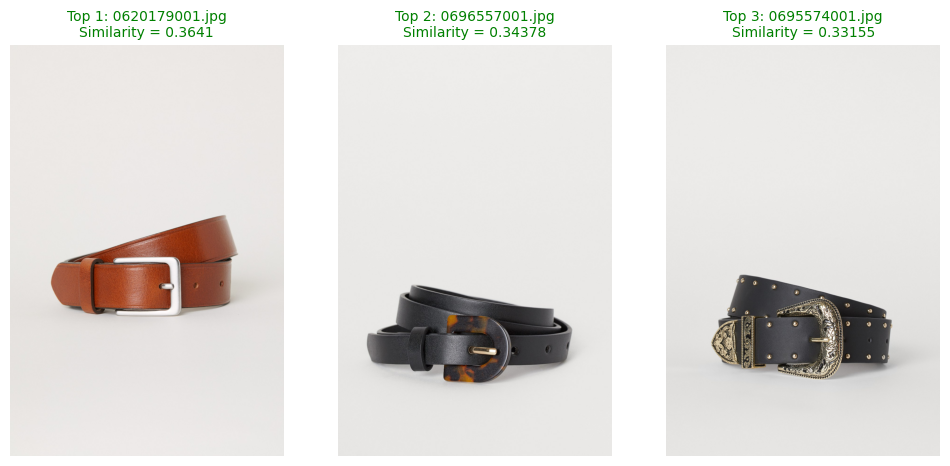

 2023-05-02 12:07:30 Powered by Azure Computer Vision Florence


,image_file,similarity
51,fashion/0620179001.jpg,0.364104
1227,fashion/0696557001.jpg,0.343782
1153,fashion/0695574001.jpg,0.331546
618,fashion/0642268001.jpg,0.308012
591,fashion/0641204001.jpg,0.296985
...,...,...
850,fashion/0649555002.jpg,0.126702
506,fashion/0629656005.jpg,0.126223
1308,fashion/0697532004.jpg,0.124825
1199,fashion/0696148002.jpg,0.123336


<IPython.core.display.Javascript object>

In [60]:
get_results_using_prompt(query, image_files, list_emb, topn=3, disp=False)

### Test 13

In [61]:
query = "butterfly hair pin"

<IPython.core.display.Javascript object>


Similar images using query = butterfly hair pin


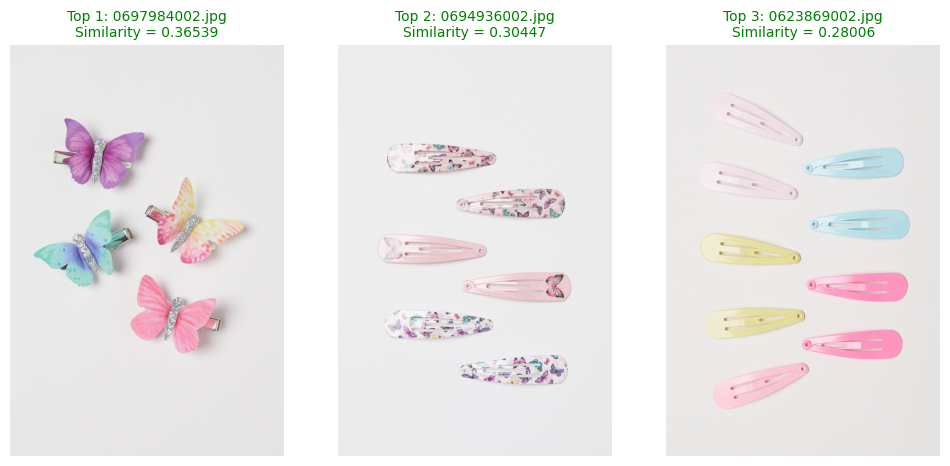

 2023-05-02 12:07:32 Powered by Azure Computer Vision Florence


,image_file,similarity
1338,fashion/0697984002.jpg,0.365386
1113,fashion/0694936002.jpg,0.304470
224,fashion/0623869002.jpg,0.280065
500,fashion/0629485001.jpg,0.253532
1288,fashion/0697112001.jpg,0.252208
...,...,...
1329,fashion/0697920007.jpg,0.062204
1330,fashion/0697920035.jpg,0.055483
1332,fashion/0697920055.jpg,0.052533
760,fashion/0647207008.jpg,0.052303


<IPython.core.display.Javascript object>

In [62]:
get_results_using_prompt(query, image_files, list_emb, topn=3, disp=False)

### Test 14

In [63]:
query = "shirt with shark, dolphin, fish or whale"

<IPython.core.display.Javascript object>


Similar images using query = shirt with shark, dolphin, fish or whale


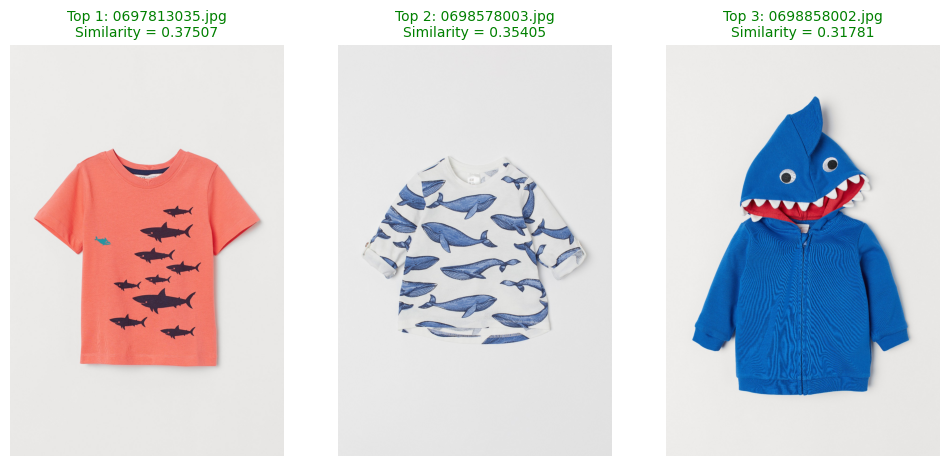

 2023-05-02 12:07:34 Powered by Azure Computer Vision Florence


,image_file,similarity
1323,fashion/0697813035.jpg,0.375074
1373,fashion/0698578003.jpg,0.354055
1388,fashion/0698858002.jpg,0.317814
1411,fashion/0699145001.jpg,0.308211
83,fashion/0620424074.jpg,0.298532
...,...,...
850,fashion/0649555002.jpg,0.039971
581,fashion/0640990001.jpg,0.039306
580,fashion/0640989002.jpg,0.036944
785,fashion/0647946004.jpg,0.034641


<IPython.core.display.Javascript object>

In [64]:
get_results_using_prompt(query, image_files, list_emb, topn=3, disp=False)

> In the next notebook we will do some image clustering using vector embeddings